In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
cd /content/drive/Shareddrives/SIA_API

/content/drive/Shareddrives/SIA_API


In [ ]:
import numpy as np
import pandas as pd

import os
import cv2
import glob
import json

import seaborn as sns
import matplotlib.colors
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings(action='ignore')

In [ ]:
def show_real(file_name):
    fig= plt.figure(figsize=(18,18))
    img = cv2.imread('data/test/images/'+file_name, cv2.COLOR_BGR2RGB)

    plt.imshow(img)

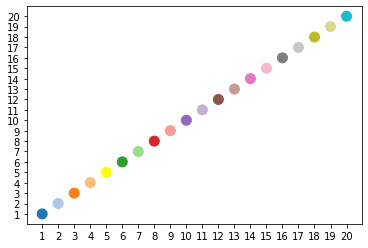

In [ ]:
test_jsons = sorted(glob.glob('/content/drive/Shareddrives/SIA_API/data/test_etc/labels/*'))
test_meta = []

for j in test_jsons:
    json_obj = json.load(open(j))
    for f in json_obj['features']:
        object_imcoords = f['properties']['object_imcoords']
        object_angle = f['properties']['object_angle']
        image_id = f['properties']['image_id'] # 영상 ID
        type_id = f['properties']['type_id'] # 정수 (1~N), 클래스 id
        type_name = f['properties']['type_name'] # 클래스 이름

        # add to list
        test_meta.append([image_id, type_id, type_name, object_angle, object_imcoords])

# Make dataframe
df_test = pd.DataFrame(test_meta,
                        columns = ['image_id','type_id','type_name', 'object_angle', 'object_imcoords'])

imcoords_columns = ['point1_x', 'point1_y', 'point2_x', 'point2_y', 'point3_x', 'point3_y', 'point4_x', 'point4_y']
df_test[imcoords_columns] = df_test.apply(lambda x: list(map(float, x['object_imcoords'].split(','))), axis=1, result_type='expand')

# Check colors
colors = [plt.cm.tab20(i) for i in range(20)]
colors.insert(4,(1.0,1.0,0.0,1.0)) # 5번째 자리에 yellow 추가해서 21개로 만듬
type_colors = dict(zip(list(range(1,22)), colors))
cmap=matplotlib.colors.ListedColormap(colors)
x = np.arange(1,21)
plt.scatter(x,x,c=x, s=100, cmap=cmap, vmin=1, vmax=21)
plt.xticks(np.arange(1,21))
plt.yticks(np.arange(1,21))
plt.show()

In [ ]:
def show_n_mask(file_name, ckpt_num=None, obj_type=None, gray_mode=True):
    fig= plt.figure(figsize=(18,18))
    # plot image
    img = cv2.imread('data/test/images/'+file_name, cv2.COLOR_BGR2RGB)
    if gray_mode:
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY), cmap='gray')
    else:
        plt.imshow(img)

    if ckpt_num == None:
        print('object : {}개'.format(len(df_test[df_test.image_id == file_name])))
        for idx, row in df_test[df_test.image_id == file_name][['type_id']+imcoords_columns].iterrows():
            if (obj_type==int(row.type_id)):
                coords = list(row[imcoords_columns].values) + list(row[imcoords_columns].values[:2])
                plt.fill(coords[::2],coords[1::2], facecolor=type_colors[int(row.type_id)], edgecolor=type_colors[int(row.type_id)], linewidth=2, alpha=0.5)
                # Label 'type_id' 1~21
                cx = row[imcoords_columns].values[::2].mean()
                cy = row[imcoords_columns].values[1::2].mean()
                plt.text(cx,cy, str(int(row.type_id)), color='white', fontsize=12, fontweight='semibold')
            elif obj_type == None:
                coords = list(row[imcoords_columns].values) + list(row[imcoords_columns].values[:2])
                plt.fill(coords[::2],coords[1::2], facecolor=type_colors[int(row.type_id)], edgecolor=type_colors[int(row.type_id)], linewidth=2, alpha=0.5)
                # Label 'type_id' 1~21
                cx = row[imcoords_columns].values[::2].mean()
                cy = row[imcoords_columns].values[1::2].mean()
                plt.text(cx,cy, str(int(row.type_id)), color='white', fontsize=12, fontweight='semibold')

    else:
        test_path = '/content/drive/Shareddrives/SIA_API/csv/baseline_{}.csv'.format(ckpt_num)
        test = pd.read_csv(test_path)
        print('object : {}개'.format(test.shape[0]))
        for idx, row in test[test.file_name == file_name][['class_id']+imcoords_columns].iterrows():
            if (obj_type==row.class_id):
                coords = list(row[imcoords_columns].values) + list(row[imcoords_columns].values[:2])
                plt.fill(coords[::2],coords[1::2], facecolor=type_colors[row.class_id], edgecolor=type_colors[row.class_id], linewidth=2, alpha=0.5)
                # Label 'class_id' 1~21
                cx = row[imcoords_columns].values[::2].mean()
                cy = row[imcoords_columns].values[1::2].mean()
                plt.text(cx,cy, str(int(row.class_id)), color='white', fontsize=12, fontweight='semibold')
            elif obj_type == None:
                coords = list(row[imcoords_columns].values) + list(row[imcoords_columns].values[:2])
                plt.fill(coords[::2],coords[1::2], facecolor=type_colors[row.class_id], edgecolor=type_colors[row.class_id], linewidth=2, alpha=0.5)
                # Label 'class_id' 1~21
                cx = row[imcoords_columns].values[::2].mean()
                cy = row[imcoords_columns].values[1::2].mean()
                plt.text(cx,cy, str(int(row.class_id)), color='white', fontsize=12, fontweight='semibold')
        plt.show()

In [81]:
n = 1
#n = 4
#n = 5
file_list = os.listdir('data/test/images')
file_name = file_list[n]
file_name

'OBJ05716_PS3_K3A_NIA0363.png'

# Real Image

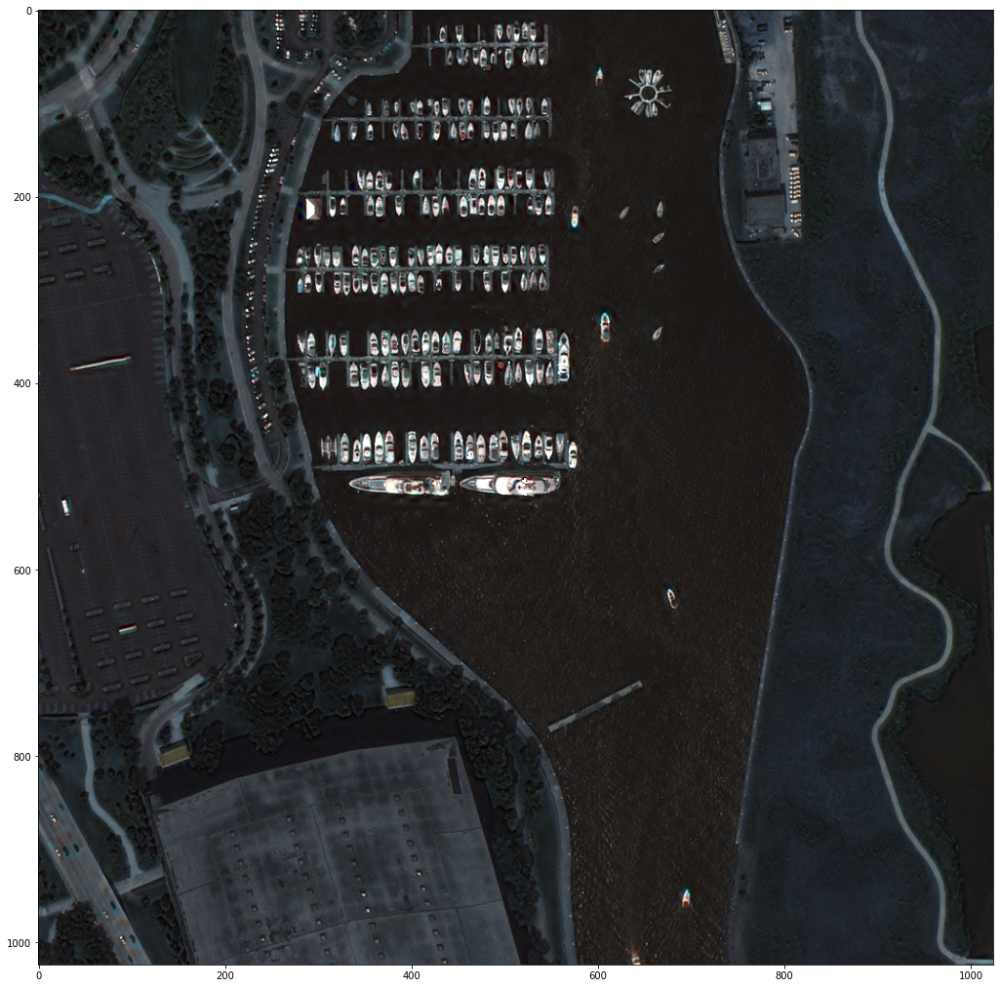

In [82]:
show_real(file_name)

# Groundtruth

object : 458개


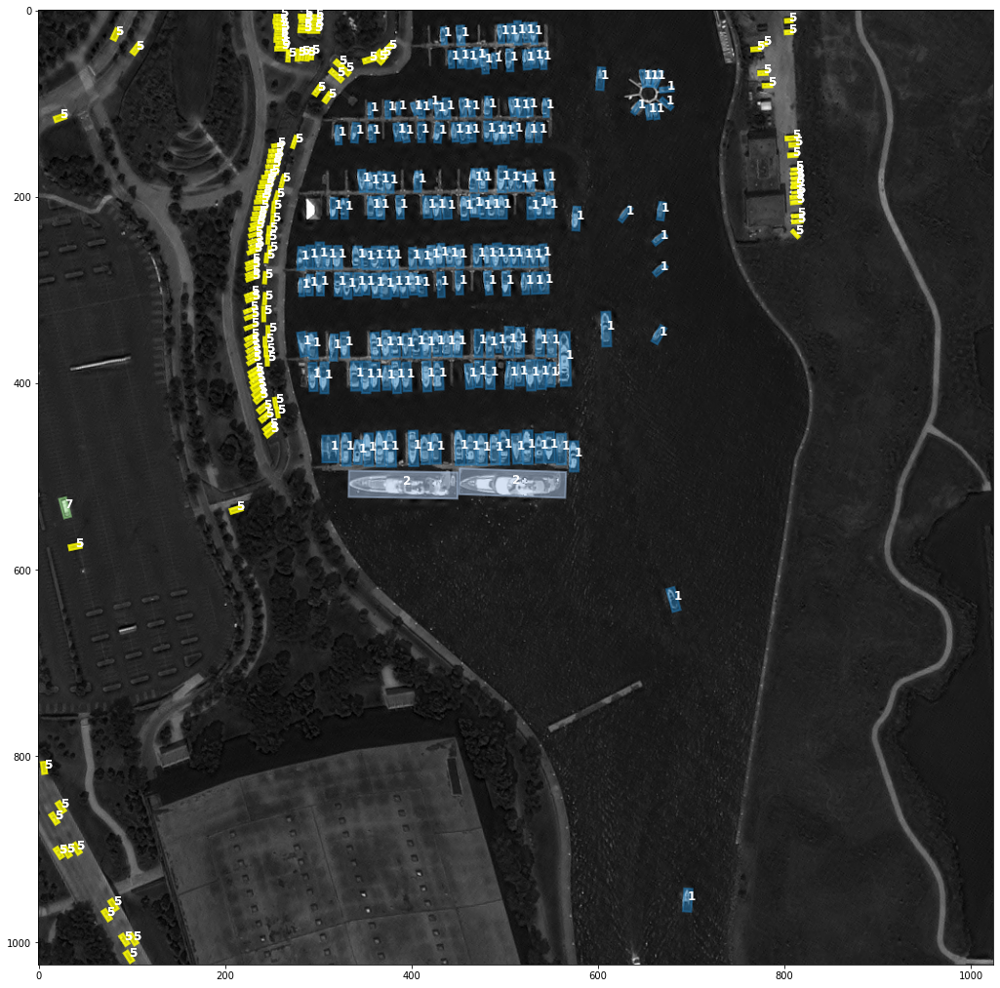

In [83]:
show_n_mask(file_name)

# Inference

object : 774개


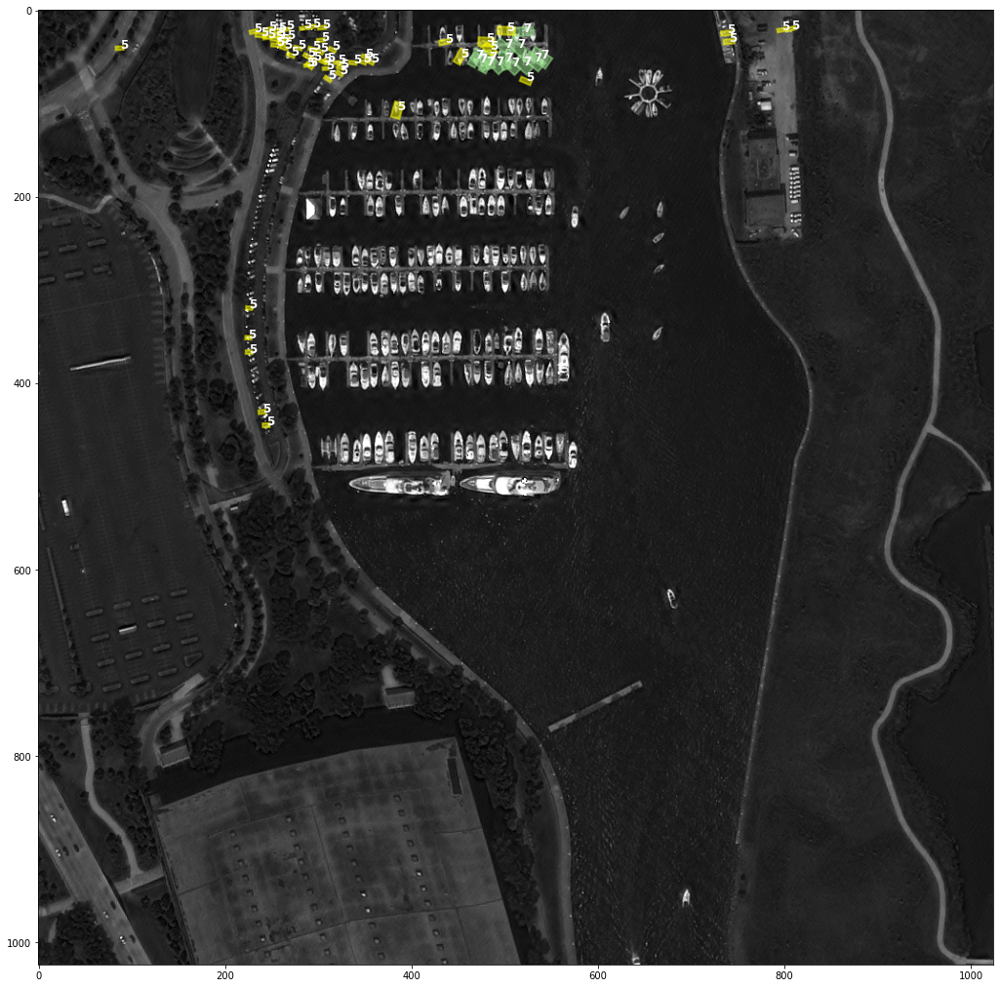

In [84]:
show_n_mask(file_name, 10000)

object : 828개


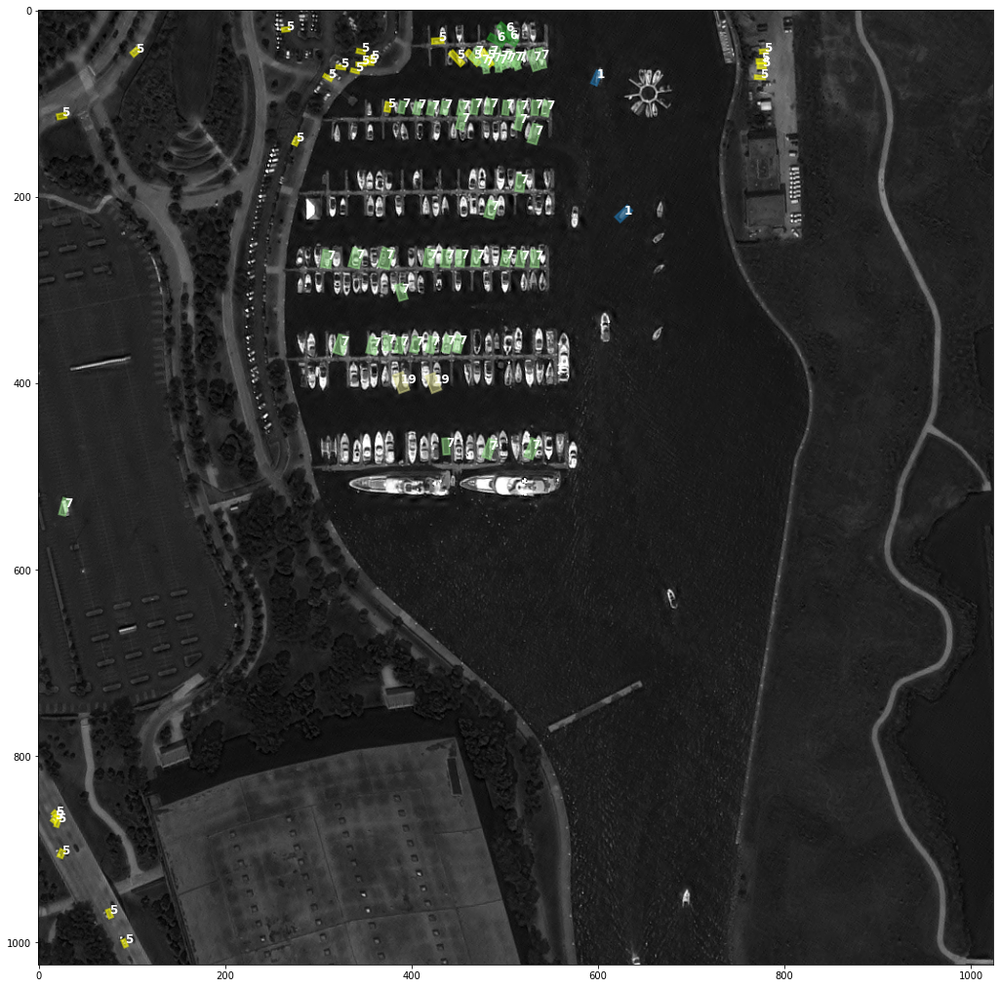

In [85]:
show_n_mask(file_name, 20000)

object : 756개


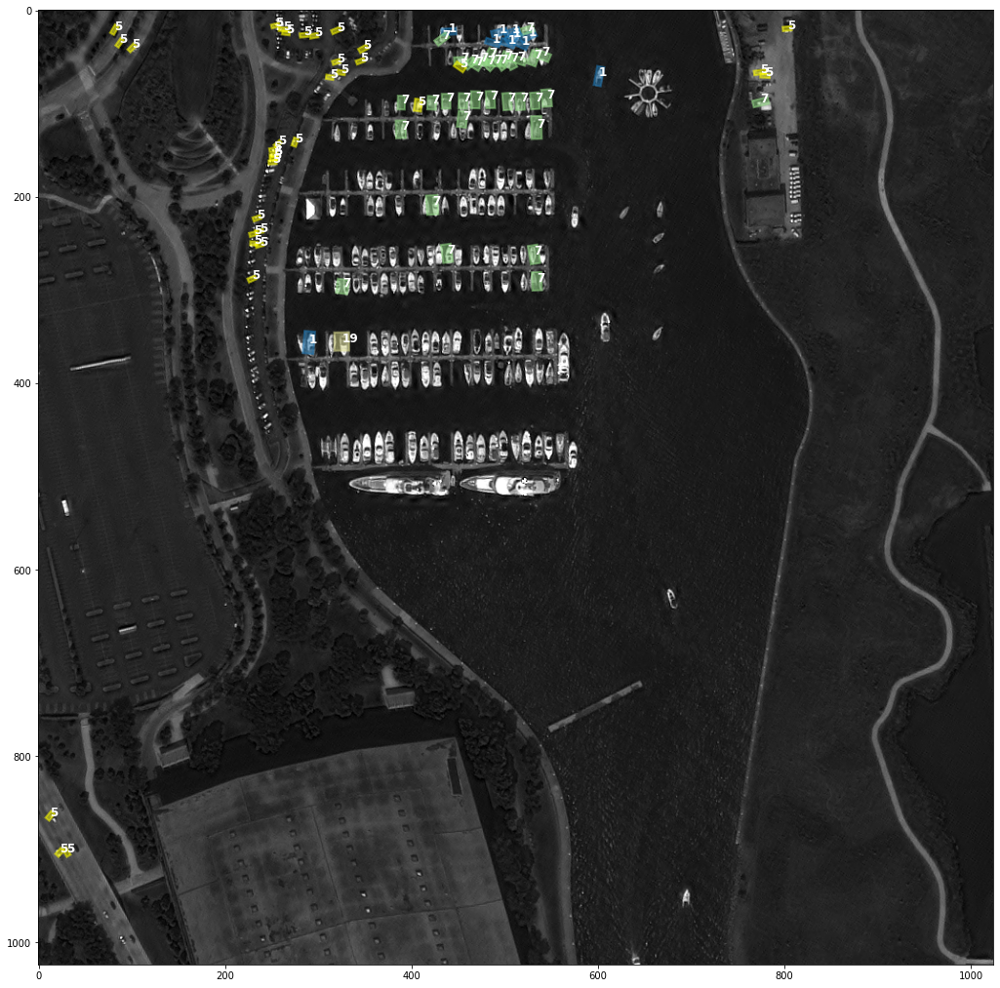

In [86]:
show_n_mask(file_name, 30000)

object : 910개


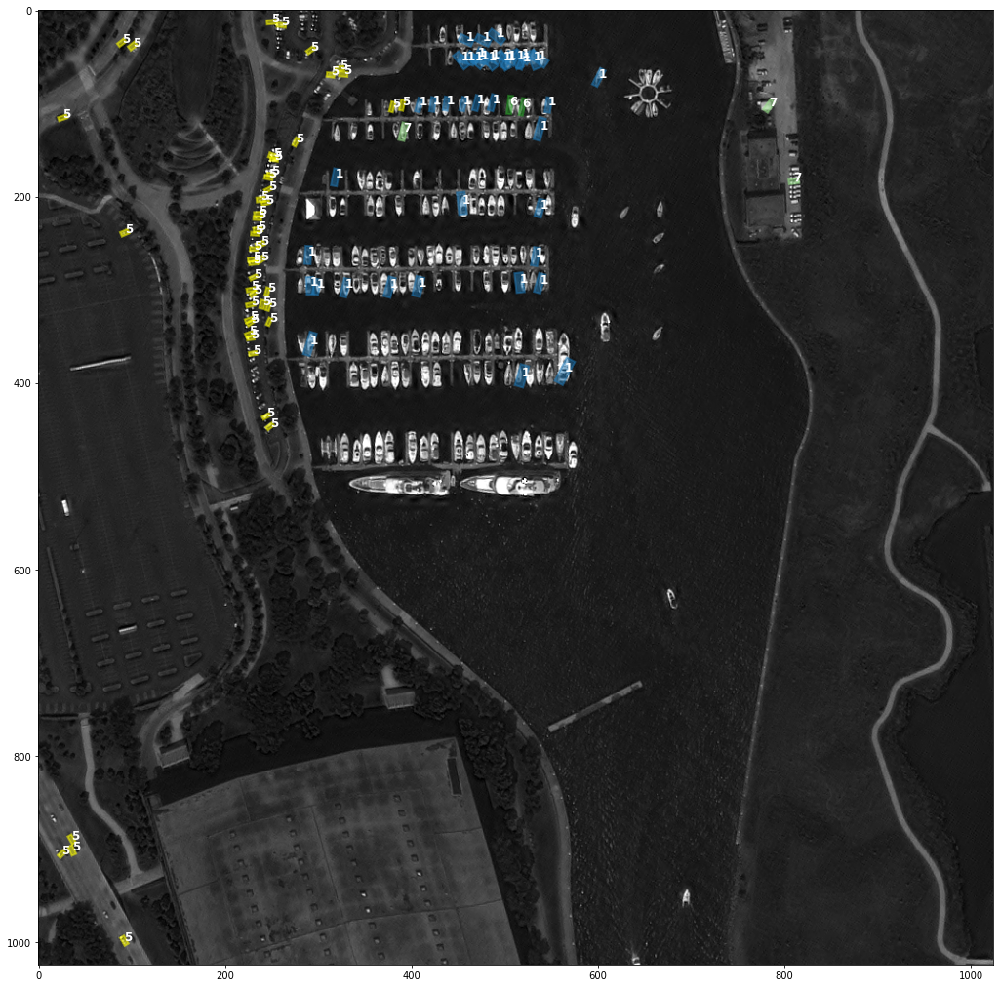

In [87]:
show_n_mask(file_name, 40000)

object : 560개


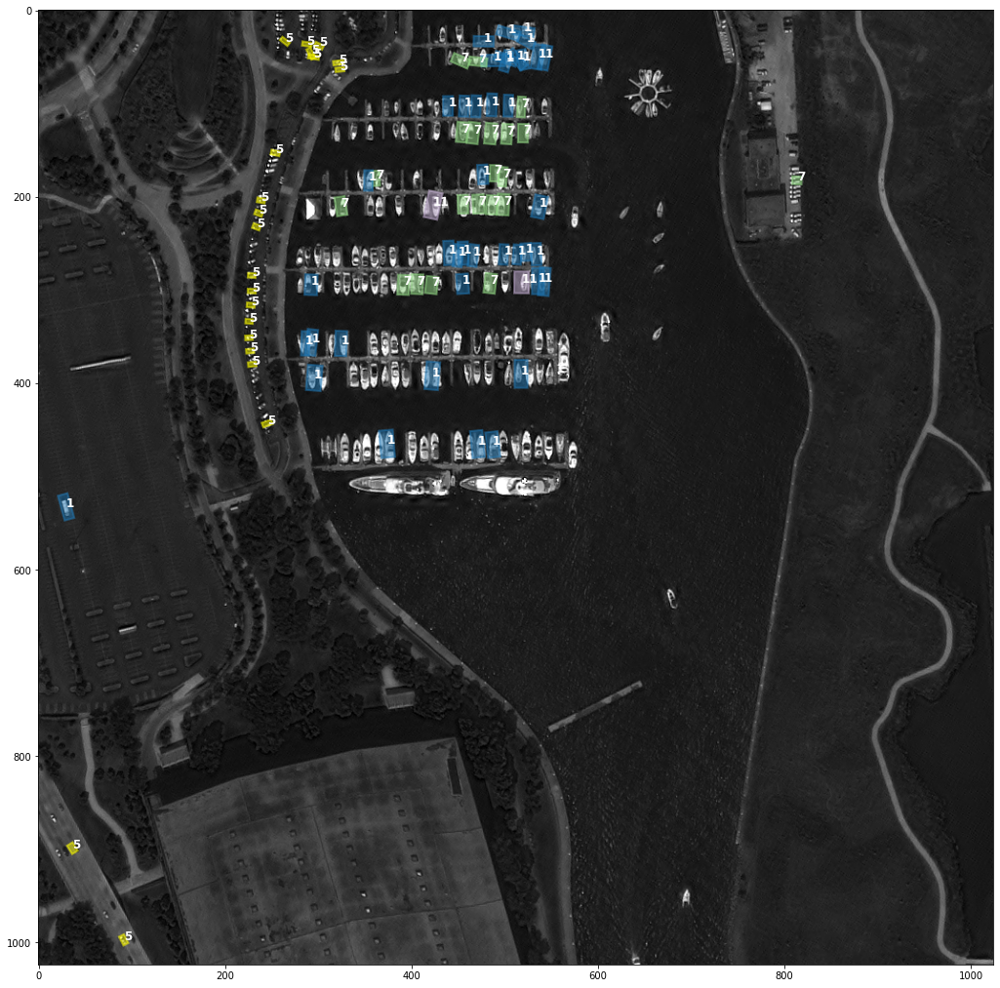

In [88]:
show_n_mask(file_name, 50000)

object : 705개


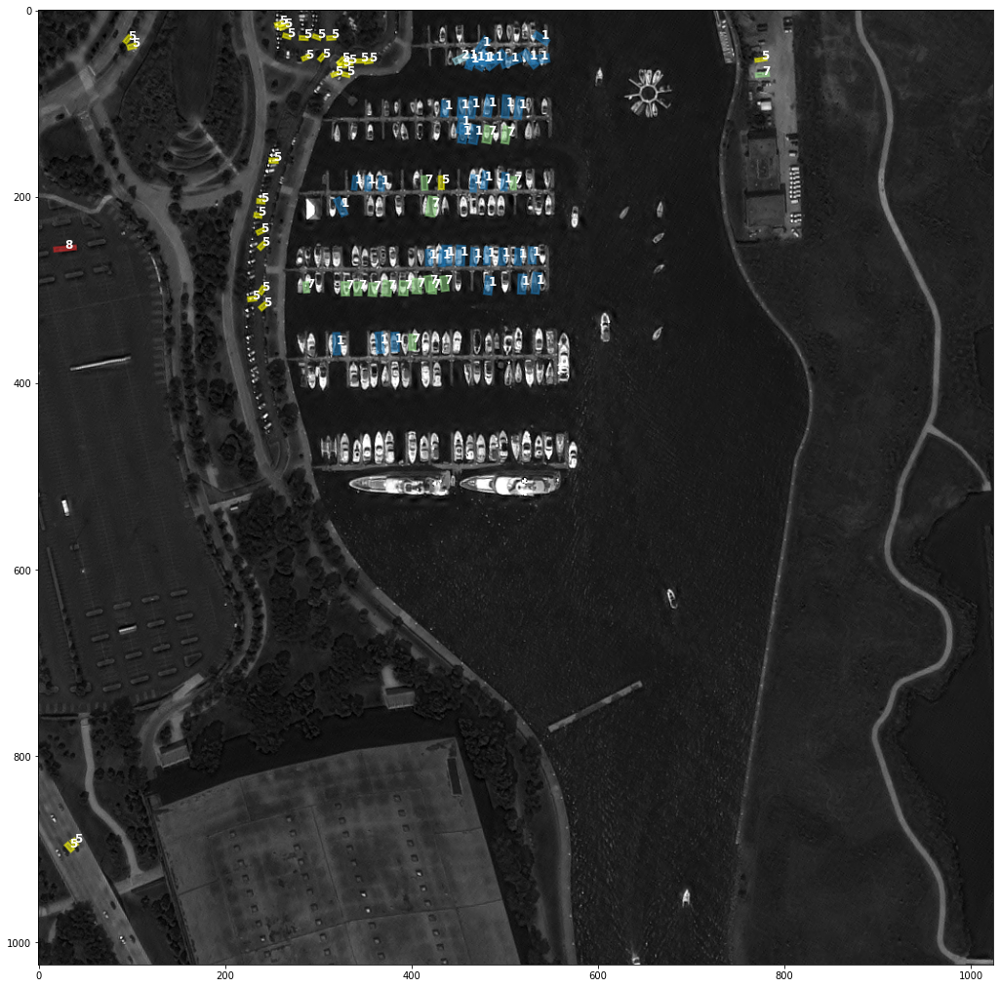

In [89]:
show_n_mask(file_name, 60000)